In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import networkx as nx
%matplotlib inline

In [2]:
plt.rcParams['figure.figsize'] = [15, 10]
sns.set_style('whitegrid')
plt.rcParams['font.size'] = 20.0
plt.rcParams['xtick.labelsize'] = 20.0
plt.rcParams['ytick.labelsize'] = 20.0

In [3]:
import pickle

In [4]:
import os

# Load all pickle dictionaries

In [7]:
os.listdir('../media-opt/data/pickle_files/')

['G_nx_9606.pickle',
 'G_nx_9913.pickle',
 'G_diff_9606_9913_eigs.pickle',
 'G_dict_nx_9913.pickle',
 'G_dict_nx_9606.pickle',
 'G_dict_nx_72004.pickle',
 'G_dict_nx_10029.pickle',
 'G_dict_nx_43346.pickle']

In [8]:
fps = ['G_dict_nx_9913.pickle',
 'G_dict_nx_9606.pickle',
 'G_dict_nx_72004.pickle',
 'G_dict_nx_10029.pickle',
 'G_dict_nx_43346.pickle']

In [9]:
fp_prefix = '../media-opt/data/pickle_files/'


In [10]:
G_dicts = []
for fp in fps:
    file = open(fp_prefix + fp,'rb')
    G_dict = pickle.load(file)
    G_dicts.append(G_dict)
    print(fp)
    file.close()

G_dict_nx_9913.pickle
G_dict_nx_9606.pickle
G_dict_nx_72004.pickle
G_dict_nx_10029.pickle
G_dict_nx_43346.pickle


In [11]:
G_dicts[0].keys()

dict_keys(['G', 'adj_matrix'])

# Number of shared vertices?

In [14]:
species_ids = [
    9913,
    9606, 
    72004,
    10029, 
    43346
]

In [15]:
nodelists = {}

In [16]:
for idx, Gd in zip(species_ids, G_dicts): 
    G = Gd['G']
    nodelists[idx] = list(G.nodes())

In [18]:
nodelists

{9913: ['ADRBK2',
  'KCNJ1',
  'FOXF1',
  'UBL7',
  'TTC33',
  'TXN2',
  'FOXRED2',
  'PRKAA1',
  'LTA',
  'SERINC1',
  'CCDC53',
  'NUP37',
  'RNF2',
  'RAB6A',
  'VPS33B',
  'LYZL6',
  'RDM1',
  'TRPV4',
  'ABI3',
  'PHOSPHO1',
  'CWC27',
  'SIRT7',
  'MAFG',
  'PYCR1',
  'PYCR2',
  'MYADML2',
  'SURF2',
  'PSMG3',
  'PKNOX2',
  'SNAPC4',
  'THBS3',
  'RPL22',
  'PRDM14',
  'PCDH7',
  'FEN1',
  'CRLS1',
  'LRRN4',
  'SDF2L1',
  'CFHR5',
  'FABP4',
  'TFB2M',
  'LRPAP1',
  'RECK',
  'ADSL',
  'GLIPR2',
  'CCSAP',
  'GRWD1',
  'KCNJ14',
  'MRPS30',
  'COL4A3BP',
  'CYP1A2',
  'HSD17B12',
  'ALCAM',
  'SEC31B',
  'NDUFB8',
  'HIF1AN',
  'PDCD1LG2',
  'ATPAF1',
  'EFCAB14',
  'SETDB1',
  'CERS2',
  'GPR75',
  'MRPL23',
  'FAM69C',
  'KIAA0907',
  'VPS54',
  'USP43',
  'HAO2',
  'DHH',
  'SPATA5',
  'FGF18',
  'TNFSF13',
  'SENP3',
  'EIF4A1',
  'CD68',
  'MPDU1',
  'FRYL',
  'EPHX1',
  'CCDC178',
  'NFU1',
  'FARP1',
  'LOC788401',
  'RFX4',
  'USP40',
  'LRFN3',
  'IRF2BP1',
  'LGALSL',

In [14]:
overlaps = {}

In [15]:
for i in range(5): 
    for j in range(i): 
        spec_a = species_ids[i]
        spec_b = species_ids[j]
        overlap = list(set(nodelists[spec_a]).intersection(nodelists[spec_b]))
        overlaps[(spec_a, spec_b)] = len(overlap)

In [16]:
overlaps

{(9606, 9913): 16405,
 (72004, 9913): 15123,
 (72004, 9606): 15639,
 (10029, 9913): 172,
 (10029, 9606): 174,
 (10029, 72004): 181,
 (43346, 9913): 12512,
 (43346, 9606): 12954,
 (43346, 72004): 12286,
 (43346, 10029): 148}

In [18]:
mat = np.ones(shape=(5, 5))

In [19]:
mat

array([[1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1.],
       [1., 1., 1., 1., 1.]])

In [20]:
for i in range(5): 
    for j in range(i): 
        spec_a = species_ids[i]
        spec_b = species_ids[j]
        overlap = list(set(nodelists[spec_a]).intersection(nodelists[spec_b]))
        mat[i, j] = float(len(overlap)) / float(len(nodelists[spec_a]))
        mat[j, i] = float(len(overlap)) / float(len(nodelists[spec_b]))
#         overlaps[(spec_a, spec_b)] = len(overlap)

In [21]:
mat

array([[1.        , 0.8278246 , 0.76313266, 0.00867942, 0.6313771 ],
       [0.84640388, 1.        , 0.80688267, 0.0089774 , 0.66835208],
       [0.77118817, 0.79750127, 1.        , 0.00922998, 0.62651708],
       [0.0081155 , 0.00820987, 0.00854015, 1.        , 0.00698311],
       [0.64748499, 0.6703581 , 0.63578969, 0.00765887, 1.        ]])

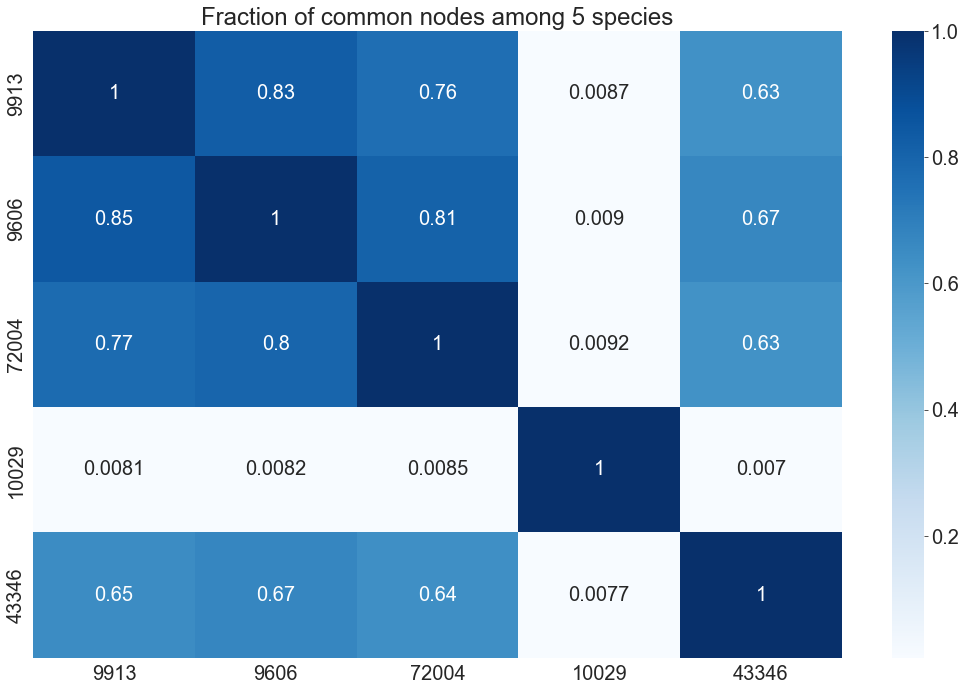

In [30]:
sns.heatmap(mat, annot=True, cmap='Blues');
plt.xticks(ticks = np.arange(5) + 0.5, labels=species_ids);
plt.yticks(ticks = np.arange(5) + 0.5, labels=species_ids);
plt.title('Fraction of common nodes among 5 species')
plt.tight_layout()
plt.savefig('figs/species_vertex_overlaps.png')

# L2 distance between graphs? 

Pretty tough, idk. 

# Eigenvector centralities

In [35]:
import scipy

In [39]:
def eigvec_ctr(G): 
#     print('computing eigvec centralities')
    eigvec_ctr = nx.eigenvector_centrality_numpy(G)
    eigvec_ctr_normalized = np.array(list(eigvec_ctr.values()))
    eigvec_ctr_normalized = eigvec_ctr_normalized * (1.0 / sum(eigvec_ctr_normalized))
    
    print(scipy.stats.describe(eigvec_ctr_normalized))
    
#     plt.hist(eigvec_ctr_normalized, ec='k', bins=100);
#     plt.yscale('log');

In [40]:
%%time
for i in range(5): 
    print('Eigenvector centrality summary statistics for id {}'.format(species_ids[i]))
    eigvec_ctr(G_dicts[i]['G'])

Eigenvector centrality summary statistics for id 9913
DescribeResult(nobs=19817, minmax=(3.101216489592454e-22, 0.0004500896086711926), mean=5.046172478175285e-05, variance=3.223312761927259e-09, skewness=1.982341427528365, kurtosis=4.7449474927364514)
Eigenvector centrality summary statistics for id 9606
DescribeResult(nobs=19382, minmax=(4.135723358860051e-09, 0.0005892765854698009), mean=5.1594262717985686e-05, variance=2.6715630716940403e-09, skewness=2.029458295482409, kurtosis=6.393648757365776)
Eigenvector centrality summary statistics for id 72004
DescribeResult(nobs=19610, minmax=(8.106940163349137e-12, 0.0004563557814121501), mean=5.099439061703238e-05, variance=4.033317160773898e-09, skewness=1.9554994598771975, kurtosis=4.018726842284896)
Eigenvector centrality summary statistics for id 10029
DescribeResult(nobs=21194, minmax=(-3.148742639352828e-20, 0.00045812300605373895), mean=4.71831650467111e-05, variance=3.659973542258174e-09, skewness=2.0851911659298294, kurtosis=4.7

In [ ]:
%%time
for i in range(5): 
    print('Eigenvector centrality summary statistics for id {}'.format(species_ids[i]))
    eigvec_ctr(G_dicts[i]['G'])

In [41]:
%%time
for i in range(5): 
    print('Normalized mean edge weight {}'.format(species_ids[i]))
    G = G_dicts[i]['G']

    n = len(G.nodes())
    total_pairs = 0.5 * float(n * (n-1))
    print(G.size(weight="weight") / total_pairs)

Normalized mean edge weight 9913
9.258923973697238
Normalized mean edge weight 9606
8.898412805437783
Normalized mean edge weight 72004
10.106219243008569
Normalized mean edge weight 10029
8.684546004200396
Normalized mean edge weight 43346
7.468135975316738
CPU times: user 26.4 s, sys: 19.2 s, total: 45.6 s
Wall time: 1min 5s


# Visualize subgraphs

### get shared nodes across 4 of the species



In [19]:
bad_species = 10029

In [20]:
shared_nodes = nodelists[9913]

In [21]:
for i in range(1, 5): 
    spec_a = species_ids[i]
    if spec_a != bad_species: 
        print(spec_a)
        overlap = list(set(nodelists[spec_a]).intersection(set(shared_nodes)))
        shared_nodes = overlap
        print(len(shared_nodes))
        print('-------')

9606
16405
-------
72004
15062
-------
43346
11916
-------


In [22]:
species_ids

[9913, 9606, 72004, 10029, 43346]

In [34]:
shared_nodes = sorted(shared_nodes)

## save subgraphs on shared nodes

In [38]:
for idx, id in enumerate(species_ids): 
    if id != bad_species: 
        G_restricted = G_dicts[idx]['G'].subgraph(shared_nodes)
        G_dicts[idx]['adj_matrix_restricted'] = nx.to_numpy_matrix(G_restricted, nodelist=shared_nodes)

In [39]:
G_dicts[0]['adj_matrix_restricted'].shape

(11916, 11916)

'../media-opt/data/pickle_files/'

In [41]:
for idx, id in enumerate(species_ids):
    if id != bad_species:
        fp = fp_prefix + 'adj_matrix_restricted_{}.npy'.format(id)

        with open(fp, 'wb') as handle:
            np.save(handle, G_dicts[idx]['adj_matrix_restricted'])
    print(fp + ' saved')


../media-opt/data/pickle_files/adj_matrix_restricted_9913.npy saved
../media-opt/data/pickle_files/adj_matrix_restricted_9606.npy saved
../media-opt/data/pickle_files/adj_matrix_restricted_72004.npy saved
../media-opt/data/pickle_files/adj_matrix_restricted_72004.npy saved
../media-opt/data/pickle_files/adj_matrix_restricted_43346.npy saved


In [42]:
from scipy import sparse


In [43]:
for idx, id in enumerate(species_ids):
    if id != bad_species:
        fp = fp_prefix + 'adj_matrix_sparse_restricted_{}.npz'.format(id)
        adj_sparse = sparse.csr_matrix(G_dicts[idx]['adj_matrix_restricted'])
        sparse.save_npz(fp, adj_sparse)
    print(fp + ' saved')


../media-opt/data/pickle_files/adj_matrix_sparse_restricted_9913.npz saved
../media-opt/data/pickle_files/adj_matrix_sparse_restricted_9606.npz saved
../media-opt/data/pickle_files/adj_matrix_sparse_restricted_72004.npz saved
../media-opt/data/pickle_files/adj_matrix_sparse_restricted_72004.npz saved
../media-opt/data/pickle_files/adj_matrix_sparse_restricted_43346.npz saved


## make visualization comparing 2 species PPIs

In [88]:
G_9913_restricted = G_dicts[0]['G'].subgraph(shared_nodes[:300])

In [89]:
G_9606_restricted = G_dicts[1]['G'].subgraph(shared_nodes[:300])

In [58]:
sns.set_theme(context='notebook', style='white')

In [60]:
sns.set_style({'axes.facecolor':'white', 'grid.color': '.8', 'font.family':'Times New Roman'})

In [90]:
pos = nx.random_layout(G_9913_restricted)
pos2 = nx.random_layout(G_9606_restricted)

/var/folders/bk/cxdpc18j5fsc5wy5447dkm740000gn/T/ipykernel_74602/2824120497.py:29: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  plt.tight_layout()


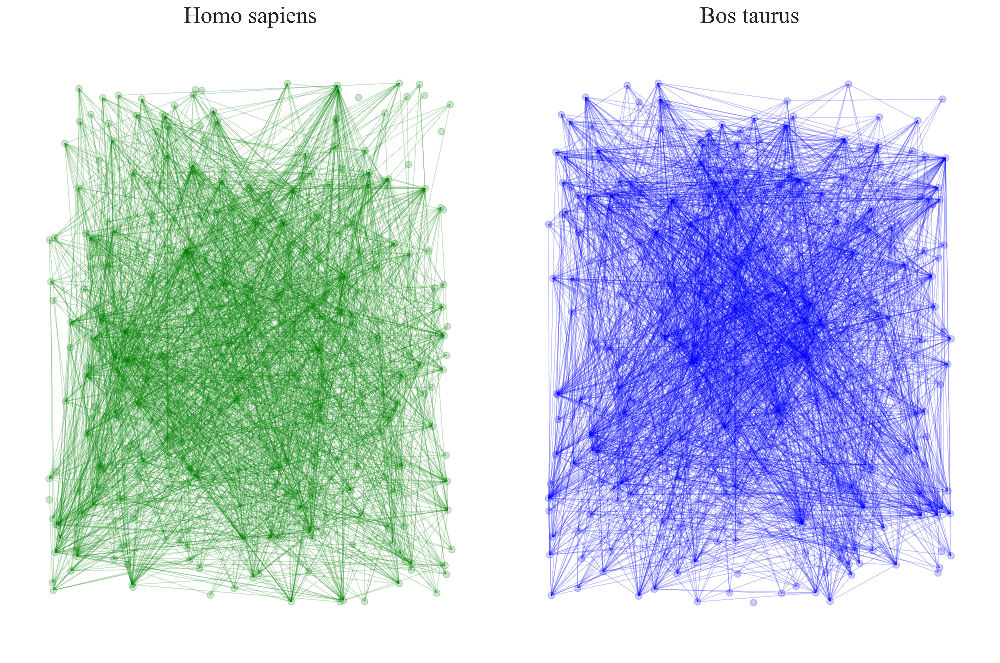

In [116]:
# fig, ax = plt.subplots(1, 2, dpi=175)

# quadrants = 0, 1

# G=nx.grid_2d_graph(1, 2)  #4x4 grid

fig, axes = plt.subplots(nrows=1, ncols=2, constrained_layout = True, dpi=300.0)
ax = axes.flatten()

# for i in range(2):
#     nx.draw_networkx(graphs[i], ax=ax[i])
#     ax[i].set_axis_off()



axes[0].set_title('Homo sapiens', fontsize=25)
nx.draw_networkx(G_9606_restricted, pos, with_labels=False, ax=ax[0],
                 node_size=50, node_color='green', edge_color='green', alpha=0.2)
ax[0].set_axis_off()

# plt.subplot(112)
axes[1].set_title('Bos taurus', fontsize=25)

nx.draw_networkx(G_9913_restricted, pos2, with_labels=False, ax=ax[1],
                 node_size=50, node_color='blue', edge_color='blue', alpha=0.2)
ax[1].set_axis_off()

# plt.show()
plt.tight_layout()
plt.savefig('figs/ppi_comparison_300_nodes.png');